# Import data and create datasets

In [12]:
from sklearn.neighbors import NearestNeighbors
from metric_learn import MMC_Supervised
from metric_learn import Covariance
from metric_learn import LMNN
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold, GroupKFold
from scipy.io import loadmat
from collections import Counter
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import json
import gc
%matplotlib inline

In [13]:
with open('feature_data.json', 'r') as f:
    features = json.load(f)

In [14]:
mat = loadmat('cuhk03_new_protocol_config_labeled.mat')

camId = mat['camId'].flatten()
filelist = mat['filelist'].flatten()
labels = mat['labels'].flatten()
train_idx = mat['train_idx'].flatten()
query_idx = mat['query_idx'].flatten()
gallery_idx = mat['gallery_idx'].flatten()

del mat

print(camId.shape)
print(filelist.shape)
print(labels.shape)
print(query_idx.shape)
print(train_idx.shape)
print(gallery_idx.shape)

(14096,)
(14096,)
(14096,)
(1400,)
(7368,)
(5328,)


In [15]:
features = np.array(features)
features.shape

(14096, 2048)

In [16]:
X_train = features[train_idx-1]
Y_train = labels[train_idx-1]
Y_train_global_idx = train_idx-1
X_query = features[query_idx-1]
Y_query = labels[query_idx-1]
Y_query_global_idx = query_idx-1
X_gallery = features[gallery_idx-1]
Y_gallery = labels[gallery_idx-1]
Y_gallery_global_idx = gallery_idx-1
print(X_train.shape)
print(Y_train.shape)
print(X_query.shape)
print(Y_query.shape)
print(X_gallery.shape)
print(Y_gallery.shape)
del features

(7368, 2048)
(7368,)
(1400, 2048)
(1400,)
(5328, 2048)
(5328,)


In [17]:
gc.collect()

155

# Tools
## To compute and evaluate

In [18]:
class GalleryTools():
    @staticmethod
    def compute_success(global_idxs_list):
        return [[labels[query_id] == labels[neigh_id] for neigh_id in neigh_ids] 
                for (query_id, neigh_ids) in global_idxs_list]
    @staticmethod
    def compute_ranks(success_list):
        return np.mean([[True in results[:i+1] for i in range(10)] for results in success_list], axis=0)
    @staticmethod
    def compute_map10(success_list):
        # This compute the area under the precision vs recall curve using trapezoidal approx (not rect)
        #(https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173)
        p_r_list = np.array([[[sum(success[:i+1])/(i+1), 
                               sum(success[:i+1])/sum(success[:10]) if True in success[:10] else 0] 
                              for i in range(10)] for success in success_list ])
        return np.mean([np.trapz(np.concatenate(([1],p_r[:,0])), 
                                 np.concatenate(([0], p_r[:,1]))) for p_r in p_r_list])
    @staticmethod
    def get_global_idxs(neighbors, gallery_idx, query_idx):
        # This function also clean-up the neighbors, deleting those from the same camera for the same person
        return [(query_idx[i], [j for j in gallery_idx[neighbors_idxs] 
                                if not (camId[j] == camId[query_idx[i]] 
                                and labels[j] == labels[query_idx[i]])]) 
                                for i, neighbors_idxs in enumerate(neighbors)]      
class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    def fit(self, input_array, y=None):
        return self
    def transform(self, input_array, y=None):
        return input_array*1
class KnnEstimatorGallery(BaseEstimator, ClassifierMixin, GalleryTools):
    def __init__(self, transformer=IdentityTransformer(), knn_args=dict()):
        if knn_args is None:
            knn_args = dict()
        self.transformer = transformer
        self._knn_args = knn_args
        self._score = 0
        # These scores refers to the test set : query/gallery
        self._global_idxs_gallery = []
        self._ranks_gallery = []
        self._score_gallery = 0
    def fit(self, X, Y_train_global_idx):
        self.transformer = self.transformer.fit(X, labels[Y_train_global_idx])
        return self
    def score(self, X, Y_val_global_idx):
        X_transformed = self.transformer.transform(X)
        X_ga, X_qu, Y_ga, Y_qu = train_test_split(X_transformed, Y_val_global_idx, 
                                                  test_size=0.2, stratify=labels[Y_val_global_idx])
        knn = NearestNeighbors(n_neighbors=40, **self._knn_args).fit(X_ga)
        neighbors = np.array(knn.kneighbors(X_qu, return_distance=False))
        global_idxs = self.get_global_idxs(neighbors, Y_ga, Y_qu)
        success = self.compute_success(global_idxs)
        self._score = self.compute_map10(success)
        return self._score
    def predict_gallery(self, X, Y_val_global_idx):
        X_transformed = self.transformer.transform(X)
        X_ga, X_qu, Y_ga, Y_qu = train_test_split(X_transformed, Y_val_global_idx, 
                                                  test_size=0.2, stratify=labels[Y_val_global_idx])
        knn = NearestNeighbors(n_neighbors=40, **self._knn_args).fit(X_ga)
        neighbors = np.array(knn.kneighbors(X_qu, return_distance=False))
        return self.get_global_idxs(neighbors, Y_ga, Y_qu)
    def transform(self, X):
        return self.transformer.transform(X)  
    def print_metrics(self):
        # This function perform tests on query/gallery set
        X_gallery_transformed = self.transform(X_gallery)
        X_query_transformed = self.transform(X_query)
        knn = NearestNeighbors(n_neighbors=40, **self._knn_args).fit(X_gallery_transformed)
        neighbors = np.array(knn.kneighbors(X_query_transformed, return_distance=False))
        self._global_idxs_gallery = self.get_global_idxs(neighbors, Y_gallery_global_idx, Y_query_global_idx)
        success = self.compute_success(self._global_idxs_gallery)
        self._score_gallery = self.compute_map10(success)
        self._ranks_gallery = self.compute_ranks(success)
        print("@rank1: {:f}, @rank5: {:f}, @rank10: {:f}, mAP: {}"
              .format(self._ranks_gallery[0], self._ranks_gallery[4], 
                      self._ranks_gallery[9], self._score_gallery))  

## To display gallery

In [19]:
def frame_image(img, color="b"):
    # This function add a colored border to the source image
    b = 5
    ny, nx = img.shape[0], img.shape[1] # resolution / number of pixels in x and y
    if img.ndim == 3: # rgb
        framed_img = np.zeros((b+ny+b, b+nx+b, img.shape[2]))
        if color=='g': framed_img[:,:,1] = 1.0
        elif color=='r': framed_img[:,:,0] = 1.0
    else: assert False
    framed_img[b:-b, b:-b] = img
    return framed_img
def plot_gallery(global_idxs_list):
    success = GalleryTools.compute_success(global_idxs_list)
    plt.figure(figsize=(15, len(global_idxs_list) * 3))
    for i, (query_id, neigh_ids) in enumerate(global_idxs_list):
        plt.subplot(len(global_idxs_list), 11, (11*i)+1)
        img = mpimg.imread('images_cuhk03/' + filelist[query_id][0])
        plt.imshow(frame_image(img, 'b'), interpolation='none', aspect='auto')
        plt.axis('off')
        for j in range(10):
            plt.subplot(len(global_idxs_list), 11, (11*i)+j+2)
            img = mpimg.imread('images_cuhk03/' + filelist[neigh_ids[j]][0])
            plt.imshow(frame_image(img, 'g' if success[i][j] else 'r'), interpolation='none', aspect='auto')
            plt.axis('off')
    plt.show()

# Baseline : kNN only

In [20]:
base = KnnEstimatorGallery()
base.print_metrics()

@rank1: 0.470000, @rank5: 0.668571, @rank10: 0.749286, mAP: 0.47241735166288734


Same as lecturer, except for mAP maybe because of the method used to calculate area under curve.

In [21]:
ids_to_show = np.random.randint(0, len(X_query), size=4)

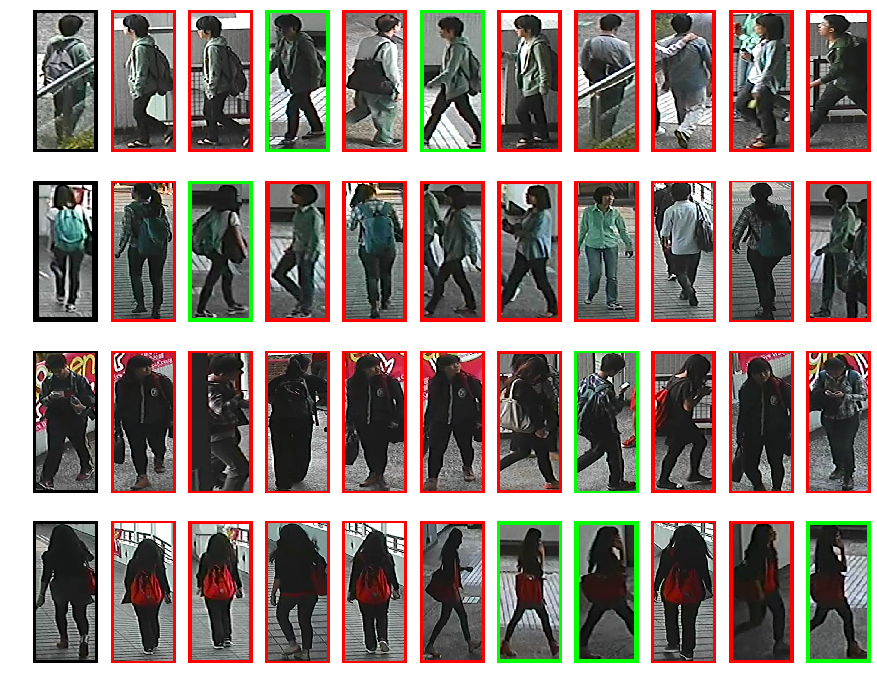

In [22]:
plot_gallery([base._global_idxs_gallery[i] for i in ids_to_show])

# kNN after PCA

In [23]:
pca = PCA(n_components=500, whiten=True).fit(X_train)

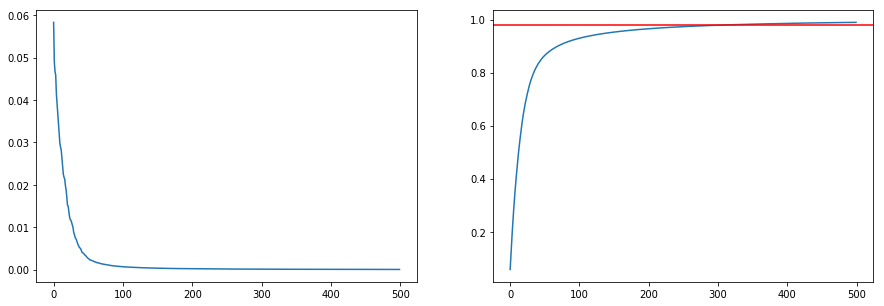

In [24]:
plt.figure(figsize=(15, 5))
plt.subplot(1,2,1)
plt.plot(pca.explained_variance_ratio_)
plt.subplot(1,2,2)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axhline(y=0.98,color='red')

In [25]:
knn_pca = KnnEstimatorGallery(PCA(n_components=500, whiten=True)).fit(X_train, Y_train_global_idx)
knn_pca.print_metrics()

@rank1: 0.384286, @rank5: 0.594286, @rank10: 0.677857, mAP: 0.39517802815570674


PCA only cannot separate clusters. We need to improve the margins.

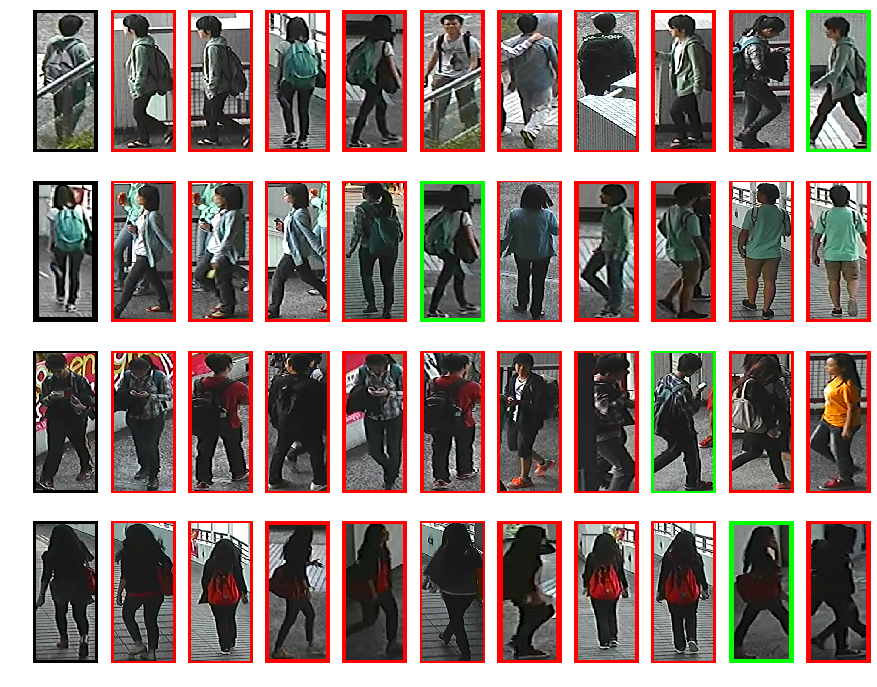

In [26]:
plot_gallery([knn_pca._global_idxs_gallery[i] for i in ids_to_show])

## Grid search on M_pca

In [27]:
N_FEATURES_OPTIONS = range(1,21)
param_grid = [
    {
        'transformer': [PCA(whiten=True)],
        'transformer__n_components': N_FEATURES_OPTIONS,
    }
]
grid_pca_knn = GridSearchCV(KnnEstimatorGallery(PCA(whiten=True)), 
                            cv=GroupKFold(n_splits=10).split(X_train, groups=Y_train), n_jobs=1, param_grid=param_grid)
grid_pca_knn.fit(X_train, Y_train_global_idx)

GridSearchCV(cv=<generator object _BaseKFold.split at 0x7fb719ac5ba0>,
       error_score='raise-deprecating',
       estimator=KnnEstimatorGallery(knn_args=None,
          transformer=PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=True)),
       fit_params=None, iid='warn', n_jobs=1,
       param_grid=[{'transformer': [PCA(copy=True, iterated_power='auto', n_components=20, random_state=None,
  svd_solver='auto', tol=0.0, whiten=True)], 'transformer__n_components': range(1, 21)}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

Text(0, 0.5, 'mAP')

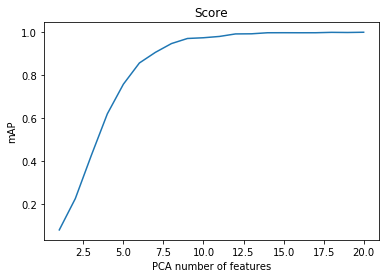

In [28]:
mean_scores = np.array(grid_pca_knn.cv_results_['mean_test_score'])
mean_scores = mean_scores.reshape(1,len(N_FEATURES_OPTIONS))
plt.plot(N_FEATURES_OPTIONS, mean_scores[0])
plt.title("Score")
plt.xlabel('PCA number of features')
plt.ylabel('mAP')

In [29]:
grid_pca_knn.best_params_

{'transformer': PCA(copy=True, iterated_power='auto', n_components=20, random_state=None,
   svd_solver='auto', tol=0.0, whiten=True), 'transformer__n_components': 20}

In [30]:
grid_pca_knn.best_estimator_.print_metrics()

@rank1: 0.412143, @rank5: 0.621429, @rank10: 0.707857, mAP: 0.42037687783446714


# kNN after LDA 

In [31]:
lda = LinearDiscriminantAnalysis().fit(X_train, Y_train)

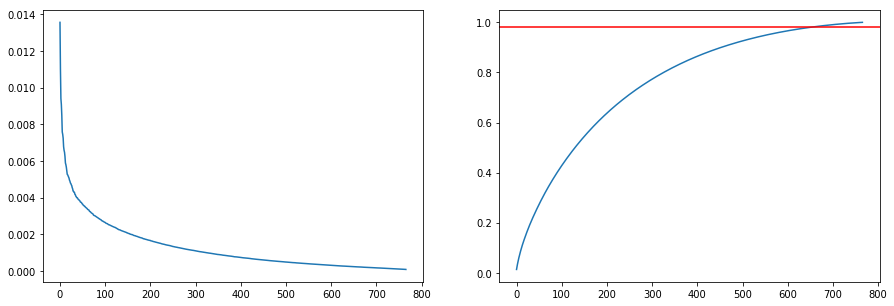

In [32]:
plt.figure(figsize=(15, 5))
plt.subplot(1,2,1)
plt.plot(lda.explained_variance_ratio_)
plt.subplot(1,2,2)
plt.plot(np.cumsum(lda.explained_variance_ratio_))
plt.axhline(y=0.98,color='red')

In [33]:
knn_lda = KnnEstimatorGallery(LinearDiscriminantAnalysis()).fit(X_train, Y_train_global_idx)
knn_lda.print_metrics()

@rank1: 0.421429, @rank5: 0.621429, @rank10: 0.717143, mAP: 0.4300835695389267


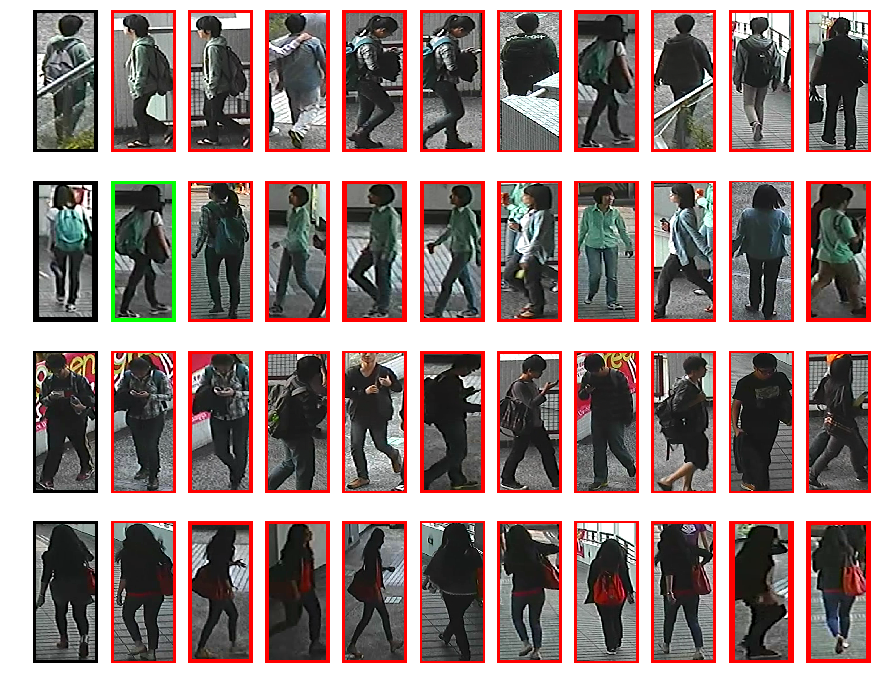

In [34]:
plot_gallery([knn_lda._global_idxs_gallery[i] for i in ids_to_show])

## Grid search on M_lda

In [35]:
N_FEATURES_OPTIONS = [50, 75, 100, 130, 160, 200, 250, 300, 400]
param_grid = [
    {
        'transformer': [LinearDiscriminantAnalysis()],
        'transformer__n_components': N_FEATURES_OPTIONS,
    }
]
grid_lda_knn = GridSearchCV(KnnEstimatorGallery(LinearDiscriminantAnalysis()), 
                            cv=GroupKFold(n_splits=3).split(X_train, groups=Y_train), n_jobs=1, param_grid=param_grid)
grid_lda_knn.fit(X_train, Y_train_global_idx)

GridSearchCV(cv=<generator object _BaseKFold.split at 0x7fb719ac9410>,
       error_score='raise-deprecating',
       estimator=KnnEstimatorGallery(knn_args=None,
          transformer=LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001)),
       fit_params=None, iid='warn', n_jobs=1,
       param_grid=[{'transformer': [LinearDiscriminantAnalysis(n_components=400, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001)], 'transformer__n_components': [50, 75, 100, 130, 160, 200, 250, 300, 400]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

Text(0, 0.5, 'mAP')

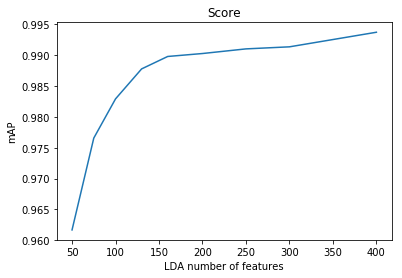

In [36]:
mean_scores = np.array(grid_lda_knn.cv_results_['mean_test_score'])
mean_scores = mean_scores.reshape(1,len(N_FEATURES_OPTIONS))
plt.plot(N_FEATURES_OPTIONS, mean_scores[0])
plt.title("Score")
plt.xlabel('LDA number of features')
plt.ylabel('mAP')

In [37]:
grid_lda_knn.best_estimator_.print_metrics()

@rank1: 0.424286, @rank5: 0.623571, @rank10: 0.714286, mAP: 0.4285700703892668


# Test PCA-LDA-kNN

In [38]:
pipe_pca_lda = Pipeline([('pca', PCA(whiten=True)), 
                         ('lda', LinearDiscriminantAnalysis())])
N_FEATURES_OPTIONS_PCA = [20, 40, 60, 80, 100]
param_grid = [
    {
        'transformer__pca__n_components': N_FEATURES_OPTIONS_PCA,
    }
]
grid_pca_lda_knn = GridSearchCV(KnnEstimatorGallery(pipe_pca_lda), 
                            cv=GroupKFold(n_splits=10).split(X_train, groups=Y_train), n_jobs=1, param_grid=param_grid)
grid_pca_lda_knn.fit(X_train, Y_train_global_idx)

GridSearchCV(cv=<generator object _BaseKFold.split at 0x7fb71bb1f410>,
       error_score='raise-deprecating',
       estimator=KnnEstimatorGallery(knn_args=None,
          transformer=Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=True)), ('lda', LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001))])),
       fit_params=None, iid='warn', n_jobs=1,
       param_grid=[{'transformer__pca__n_components': [20, 40, 60, 80, 100]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

Text(0, 0.5, 'mAP')

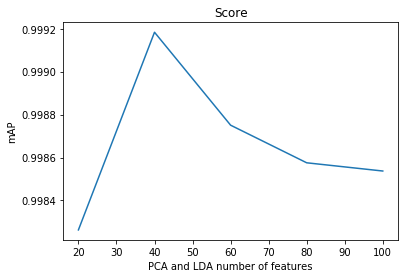

In [39]:
mean_scores = np.array(grid_pca_lda_knn.cv_results_['mean_test_score'])
mean_scores = mean_scores.reshape(1,len(N_FEATURES_OPTIONS_PCA))
plt.plot(N_FEATURES_OPTIONS_PCA, mean_scores[0])
plt.title("Score")
plt.xlabel('PCA and LDA number of features')
plt.ylabel('mAP')

In [40]:
grid_pca_lda_knn.best_estimator_.print_metrics()
print(grid_pca_lda_knn.best_params_)

@rank1: 0.468571, @rank5: 0.666429, @rank10: 0.751429, mAP: 0.47197626133786846
{'transformer__pca__n_components': 40}


# Why the mAP is always higher during training ?
... even if we take care of making cross validation on grouped Kfold (ie one label cannot be both in the train set and in the validation set)

These tests to understand why the mAP on training set is always around 0.8 while it is around 0.5 on gallery/query. It's weird because we use the same proportion query/gallery. To figure out, we tried to print the estimated galery of a kNN only, without any transformation.

In [41]:
test = KnnEstimatorGallery()
idx_gallery = test.predict_gallery(X_train, Y_train_global_idx)
print(test.score(X_train, Y_train_global_idx))

0.997682973121406


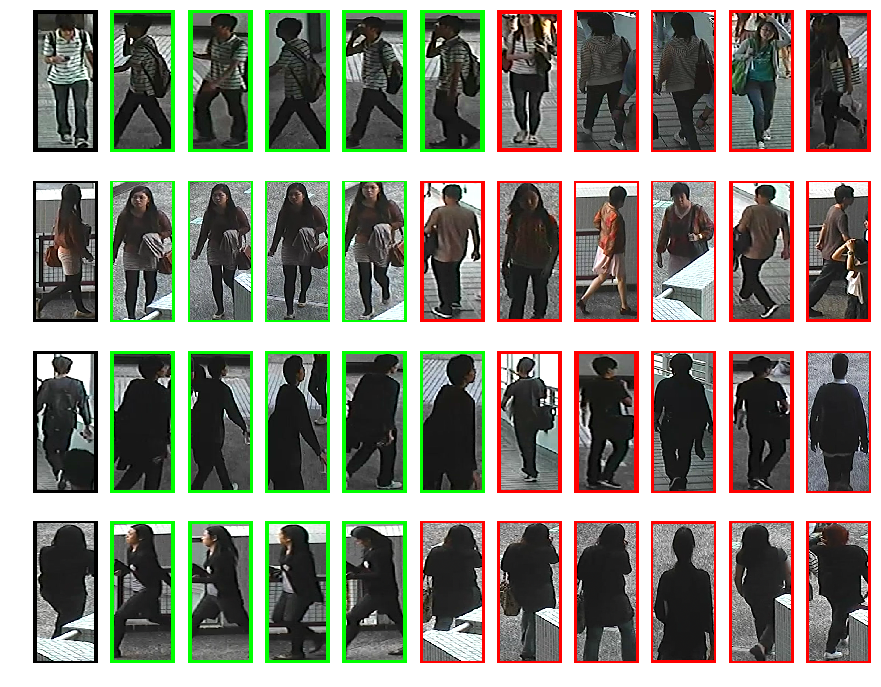

In [42]:
ids_to_show2 = np.random.randint(0, 200, size=4)
plot_gallery([idx_gallery[i] for i in ids_to_show2])

In [43]:
test2 = KnnEstimatorGallery()
idx_gallery2 = test.predict_gallery(X_gallery, Y_gallery_global_idx)
print(test2.score(X_gallery, Y_gallery_global_idx))

0.4946943991532406


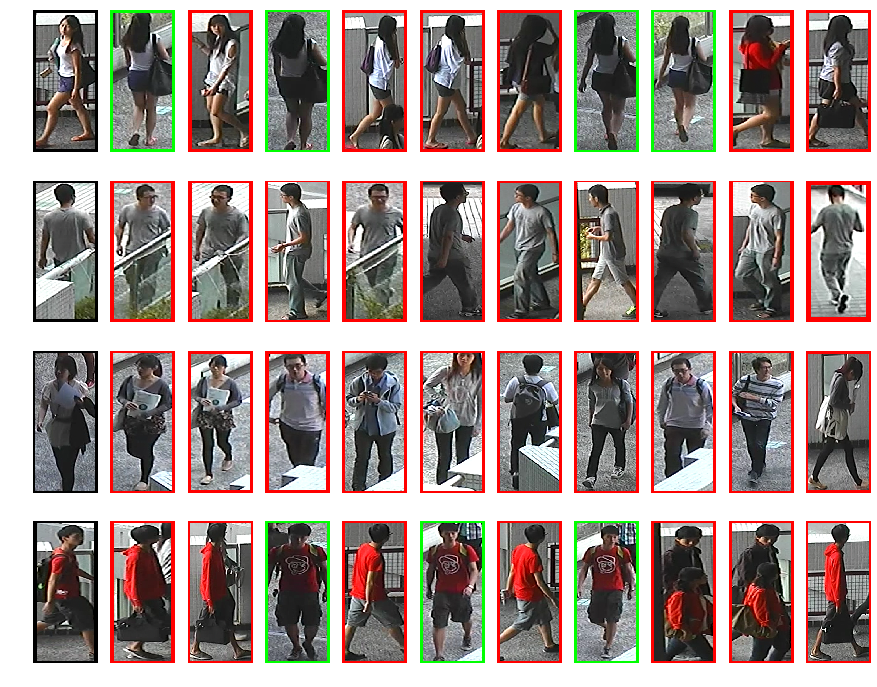

In [44]:
ids_to_show2 = np.random.randint(0, 200, size=4)
plot_gallery([idx_gallery2[i] for i in ids_to_show2])

Conclusion : it seems that the features provided by the dataset have been extracted to maximize the separability of the labels. This separability has certainly been trained on the training set, and is probably overfitted. That's why the scores on the training set are always better.

To prove that : lets compute the silhouette of X_train and X_gallery

In [45]:
print("Silhouette X_train : ", silhouette_score(X_train, Y_train, metric='euclidean'))
print("Silhouette X_gallery : ", silhouette_score(X_gallery, Y_gallery, metric='euclidean'))

Silhouette X_train :  0.5162398553708264
Silhouette X_gallery :  0.19995770142458824


The provided features space is obviously biaised. Thus, it'll be very difficult to improve the score on testing set because the score on training set is ceiled. 

# k-means baseline
Here we first compute the 700 clusters (there are 700 persons in the gallery dataset). 
For each cluster, we sort the points by their distance to the centroid.
For an image query, we first find the nearest 5 clusters (using a kNN and the cluster's centroid), then we take the points in these clusters, sorted by distance to their cluster's centroid.

In [46]:
class KmeanEstimatorGallery(BaseEstimator, ClassifierMixin, GalleryTools):
    def __init__(self, transformer=IdentityTransformer(), kmean_args={'n_clusters': 700}):
        if kmean_args is None:
            kmean_args={'n_clusters': 700}
        self.transformer = transformer
        self._kmean_args = kmean_args
        self._score = None
        # These scores refers to the test set : query/gallery
        self._global_idxs_gallery = []
        self._ranks_gallery = []
        self._score_gallery = 0
        self._silhouette_gallery= 0
    def fit(self, X, Y_train_global_idx):
        self.transformer = self.transformer.fit(X, labels[Y_train_global_idx])
        return self
    def score(self, X, Y_val_global_idx):
        X_transformed = self.transformer.transform(X)
        X_ga, X_qu, Y_ga, Y_qu = train_test_split(X_transformed, Y_val_global_idx, 
                                                  test_size=0.2, stratify=labels[Y_val_global_idx])
        kmean = KMeans(**self._kmean_args).fit(X_ga)
        clusters = [[idx for idx, j in enumerate(kmean.labels_) if j == i] 
                    for i in range(self._kmean_args['n_clusters'])]
        distance_centroid = [[np.linalg.norm(kmean.cluster_centers_ - X_ga[p_id]) 
                              for p_id in cluster] for c_id, cluster in enumerate(clusters)]
        ordered_clusters = [np.array(cluster)[np.argsort(distance_centroid[c_id])] 
                    for c_id, cluster in enumerate(clusters)]
        knn_cluster = NearestNeighbors(n_neighbors=5).fit(kmean.cluster_centers_)
        nearest_clusters = knn_cluster.kneighbors(X_qu, return_distance=False)
        neighbors = [[idx for cluster_id in c for idx in ordered_clusters[cluster_id]] 
                     for c in nearest_clusters]        
        global_idxs = self.get_global_idxs(neighbors, Y_ga, Y_qu)
        success = self.compute_success(global_idxs)
        self._score = self.compute_map10(success)
        return self._score
    def transform(self, X):
        return self.transformer.transform(X)  
    def print_metrics(self):
        # This function perform tests on query/gallery set
        X_transformed = self.transform(X_gallery)
        kmean = KMeans(**self._kmean_args).fit(X_transformed)
        clusters = [[idx for idx, j in enumerate(kmean.labels_) if j == i] 
                    for i in range(self._kmean_args['n_clusters'])]
        distance_centroid = [[np.linalg.norm(kmean.cluster_centers_ - X_transformed[p_id]) 
                    for p_id in cluster] for c_id, cluster in enumerate(clusters)]
        ordered_clusters = [np.array(cluster)[np.argsort(distance_centroid[c_id])] 
                    for c_id, cluster in enumerate(clusters)]
        knn_cluster = NearestNeighbors(n_neighbors=5).fit(kmean.cluster_centers_)
        nearest_clusters = knn_cluster.kneighbors(self.transform(X_query), return_distance=False)
        neighbors = [[idx for cluster_id in c for idx in ordered_clusters[cluster_id]] 
                     for c in nearest_clusters]
        self._global_idxs_gallery = self.get_global_idxs(neighbors, Y_gallery_global_idx, Y_query_global_idx)
        success = self.compute_success(self._global_idxs_gallery)
        self._score_gallery = self.compute_map10(success)
        self._ranks_gallery = self.compute_ranks(success)
        self._silhouette_gallery = silhouette_score(X_transformed, kmean.labels_, metric='euclidean')
        print("@rank1: {:f}, @rank5: {:f}, @rank10: {:f}, mAP: {}"
              .format(self._ranks_gallery[0], self._ranks_gallery[4], 
                      self._ranks_gallery[9], self._score_gallery)) 
        print("Silhouette : {:f}".format(self._silhouette_gallery))

In [47]:
kmean_base = KmeanEstimatorGallery()
kmean_base.print_metrics()

@rank1: 0.400714, @rank5: 0.587143, @rank10: 0.683571, mAP: 0.45204363898337113
Silhouette : 0.225080


# Naive distance benchmark
By naive, I mean not learnt...

In [48]:
mahalanobis_cov = Covariance().fit(X_train)
param_grid = [
    (IdentityTransformer(), {'metric': 'minkowski','p': 2}),    # L2
    (IdentityTransformer(), {'metric': 'correlation'}),
    (IdentityTransformer(), {'metric': 'cosine'}), 
    (mahalanobis_cov, {}) # This is a dummy Mahalanobis distance based on data covariance
]
benchmark = []
for (transformer, params) in param_grid:
    estimator = KnnEstimatorGallery(transformer, params).fit(X_train, Y_train_global_idx)
    estimator.print_metrics()
    benchmark.append(estimator)

@rank1: 0.470000, @rank5: 0.668571, @rank10: 0.749286, mAP: 0.47241735166288734
@rank1: 0.469286, @rank5: 0.663571, @rank10: 0.742857, mAP: 0.470530931122449
@rank1: 0.475714, @rank5: 0.670000, @rank10: 0.750714, mAP: 0.47618263416477696
@rank1: 0.309286, @rank5: 0.455000, @rank10: 0.501429, mAP: 0.31182992016250943


# MMC after PCA
[See this paper](http://papers.nips.cc/paper/2164-distance-metric-learning-with-application-to-clustering-with-side-information.pdf)
[and this GitHub](https://github.com/metric-learn/metric-learn)

We cannot train the distance on the raw dataset because it's too large. We have to reduce the number of features. We noticed that PCA+kNN isn't better than kNN on raw data. Let's see if the distance training overcome the loss of information due to PCA.
## Diagonal A

In [ ]:
pipe_mmc_pca = Pipeline([('pca', PCA(n_components=300, whiten=True)), 
                         ('mmc', MMC_Supervised(num_constraints=50000, diagonal=True))])
mmc_pca = KnnEstimatorGallery(pipe_mmc_pca).fit(X_train, Y_train_global_idx)

In [67]:
mmc_pca.print_metrics()

@rank1: 0.444286, @rank5: 0.640714, @rank10: 0.724286, mAP: 0.4459685964663643


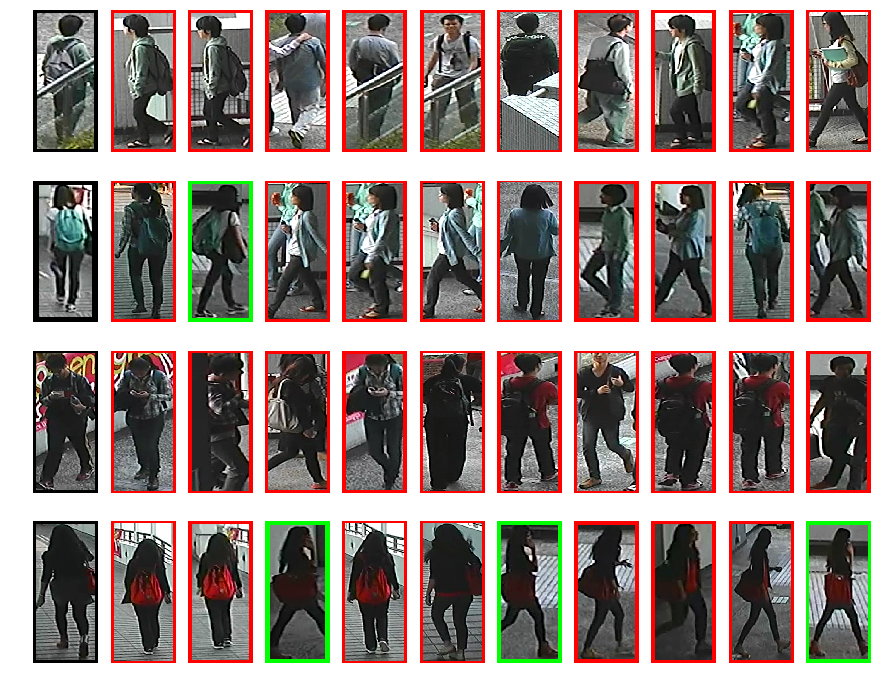

In [50]:
plot_gallery([mmc_pca._global_idxs_gallery[i] for i in ids_to_show])

## Full A

In [ ]:
pipe_mmc_pca_full = Pipeline([('pca', PCA(n_components=300, whiten=True)), 
                         ('mmc', MMC_Supervised(num_constraints=200, diagonal=False))])
mmc_pca_full = KnnEstimatorGallery(pipe_mmc_pca_full).fit(X_train, Y_train_global_idx)
mmc_pca_full.print_metrics()

In [ ]:
plot_gallery([mmc_pca_full._global_idxs_gallery[i] for i in ids_to_show])

# MMC after LDA
[See this paper](http://papers.nips.cc/paper/2164-distance-metric-learning-with-application-to-clustering-with-side-information.pdf)
[and this GitHub](https://github.com/metric-learn/metric-learn)

We cannot train the distance on the raw dataset because it's too large. We have to reduce the number of features. We noticed that PCA+kNN isn't better than kNN on raw data. Let's see if the distance training overcome the loss of information due to PCA.
## Diagonal A

In [52]:
pipe_mmc_lda = Pipeline([('lda', LinearDiscriminantAnalysis()), 
                         ('mmc', MMC_Supervised(num_constraints=10000, diagonal=True))])
mmc_lda = KnnEstimatorGallery(pipe_mmc_lda).fit(X_train, Y_train_global_idx)
mmc_lda.print_metrics()

@rank1: 0.427857, @rank5: 0.621429, @rank10: 0.712857, mAP: 0.431198400888133


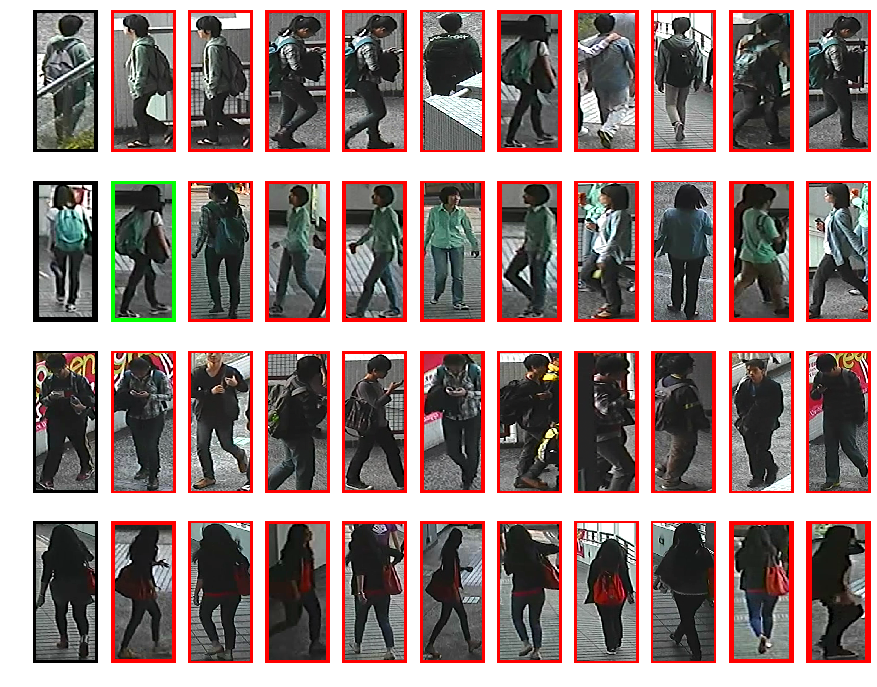

In [53]:
plot_gallery([mmc_lda._global_idxs_gallery[i] for i in ids_to_show])

### rLDA

In [54]:
pipe_mmc_rlda = Pipeline([('lda', LinearDiscriminantAnalysis(shrinkage='auto', solver='eigen')), 
                         ('mmc', MMC_Supervised(num_constraints=10000, diagonal=True))])
mmc_rlda = KnnEstimatorGallery(pipe_mmc_rlda).fit(X_train, Y_train_global_idx)
mmc_rlda.print_metrics()

@rank1: 0.467143, @rank5: 0.667857, @rank10: 0.766429, mAP: 0.4765810421390778


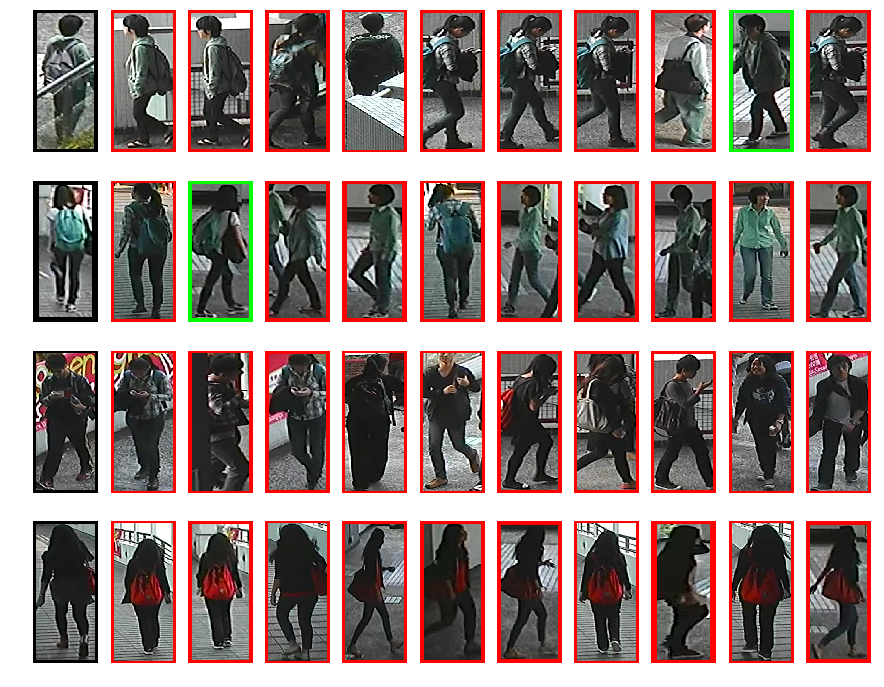

In [55]:
plot_gallery([mmc_rlda._global_idxs_gallery[i] for i in ids_to_show])

## Full
### rLDA

In [ ]:
pipe_mmc_rlda_full = Pipeline([('lda', LinearDiscriminantAnalysis(shrinkage='auto', solver='eigen')), 
                         ('mmc', MMC_Supervised(num_constraints=1000, diagonal=False))])
mmc_rlda_full = KnnEstimatorGallery(pipe_mmc_rlda_full).fit(X_train, Y_train_global_idx)
mmc_rlda_full.print_metrics()

In [ ]:
plot_gallery([mmc_rlda_full._global_idxs_gallery[i] for i in ids_to_show])

# LMNN
[See this paper](http://papers.nips.cc/paper/2795-distance-metric-learning-for-large-margin-nearest-neighbor-classification.pdf)
## LMNN only

In [ ]:
lmnn = KnnEstimatorGallery(LMNN(k=5)).fit(X_train, Y_train_global_idx)

In [68]:
lmnn.print_metrics()

@rank1: 0.452857, @rank5: 0.660714, @rank10: 0.740000, mAP: 0.4574307681405896


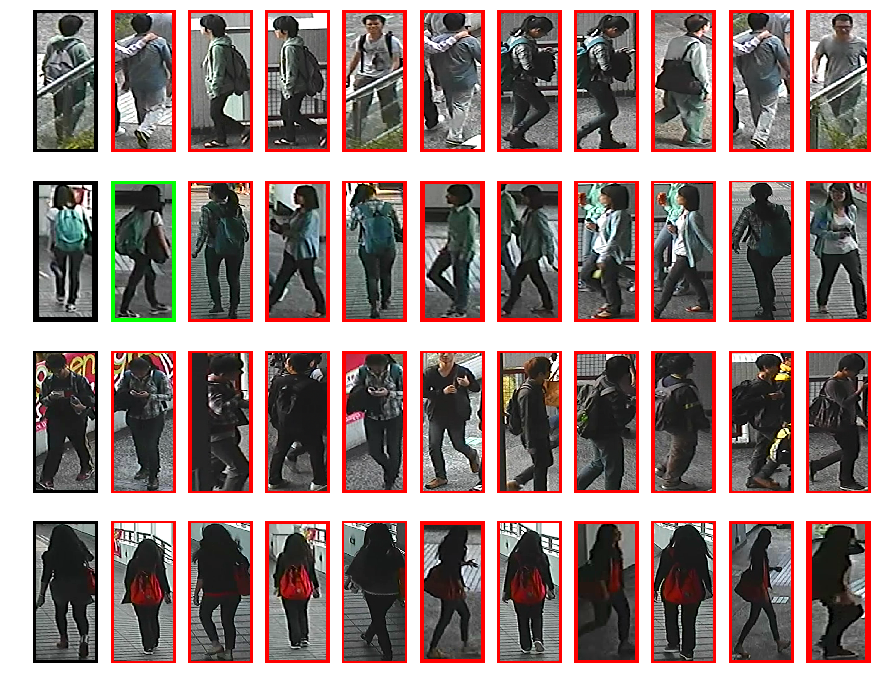

In [57]:
plot_gallery([lmnn._global_idxs_gallery[i] for i in ids_to_show])

## LMNN after rLDA

In [ ]:
pipe_pca_rlda_lmnn = Pipeline([('rlda', LinearDiscriminantAnalysis(shrinkage='auto', solver='eigen')), 
                         ('lmnn', LMNN(k=5))])
N_FEATURES_OPTIONS = [20, 40, 60, 80, 100]
param_grid = [
    {
        'transformer__rlda__n_components': N_FEATURES_OPTIONS,
    }
]
grid_pca_rlda__lmnn_knn = GridSearchCV(KnnEstimatorGallery(pipe_pca_rlda_lmnn), 
                            cv=GroupKFold(n_splits=3).split(X_train, groups=Y_train), 
                                       n_jobs=1, param_grid=param_grid)
grid_pca_rlda__lmnn_knn.fit(X_train, Y_train_global_idx)

In [59]:
grid_pca_rlda__lmnn_knn.best_estimator_.print_metrics()

@rank1: 0.448571, @rank5: 0.645714, @rank10: 0.735714, mAP: 0.45336774848828415


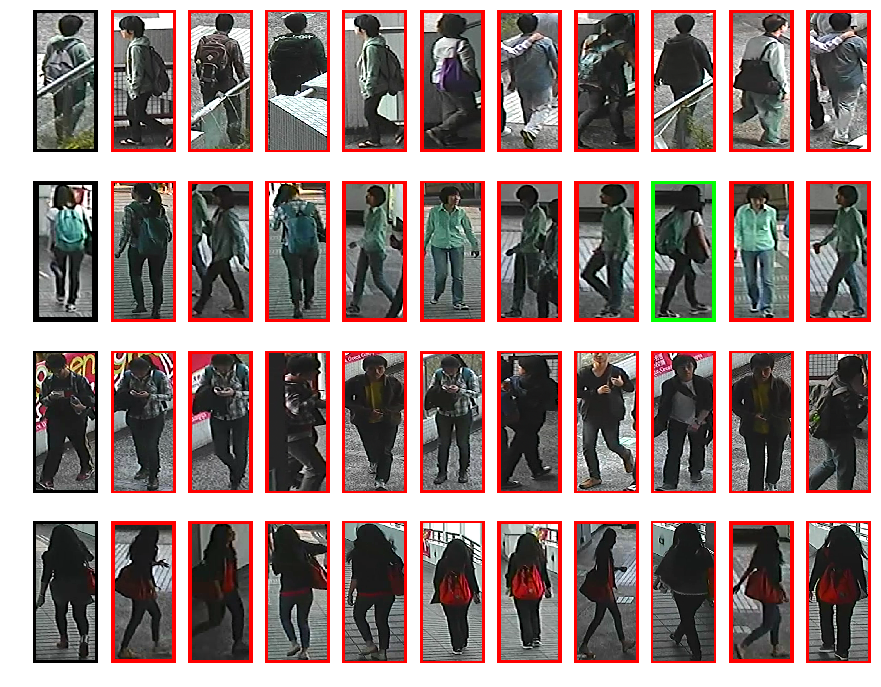

In [62]:
plot_gallery([grid_pca_rlda__lmnn_knn.best_estimator_._global_idxs_gallery[i] for i in ids_to_show])

# Comparison

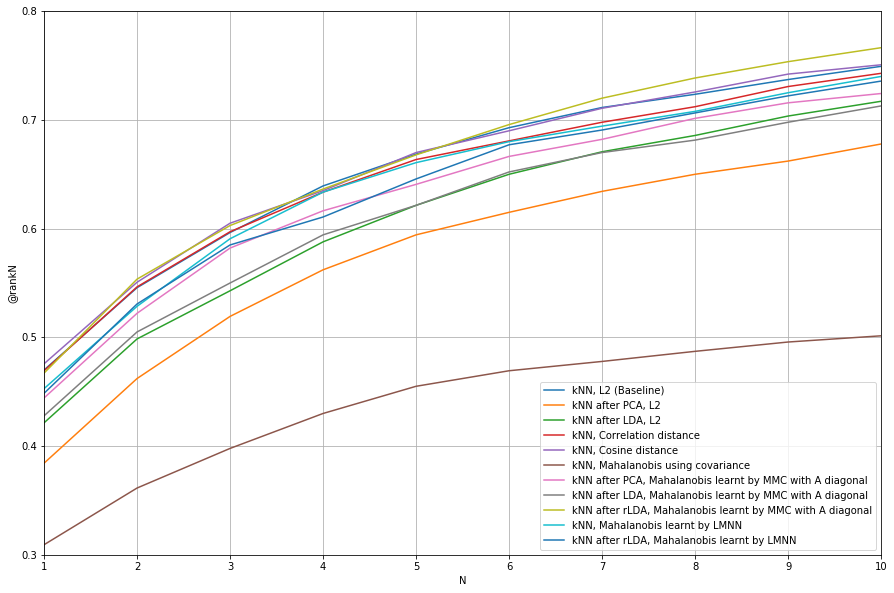

In [64]:
x = range(1,11)
plt.figure(figsize=(15, 10))
plt.plot(x, base._ranks_gallery, label='kNN, L2 (Baseline)')
plt.plot(x, knn_pca._ranks_gallery, label='kNN after PCA, L2')
plt.plot(x, knn_lda._ranks_gallery, label='kNN after LDA, L2')
plt.plot(x, benchmark[1]._ranks_gallery, label='kNN, Correlation distance')
plt.plot(x, benchmark[2]._ranks_gallery, label='kNN, Cosine distance')
plt.plot(x, benchmark[3]._ranks_gallery, label='kNN, Mahalanobis using covariance')
plt.plot(x, mmc_pca._ranks_gallery, label='kNN after PCA, Mahalanobis learnt by MMC with A diagonal')
plt.plot(x, mmc_lda._ranks_gallery, label='kNN after LDA, Mahalanobis learnt by MMC with A diagonal')
plt.plot(x, mmc_rlda._ranks_gallery, label='kNN after rLDA, Mahalanobis learnt by MMC with A diagonal')
plt.plot(x, lmnn._ranks_gallery, label='kNN, Mahalanobis learnt by LMNN')
plt.plot(x, grid_pca_rlda__lmnn_knn.best_estimator_._ranks_gallery, label='kNN after rLDA, Mahalanobis learnt by LMNN')
plt.legend()
plt.grid()
plt.axis([1, 10, 0.3, 0.8])
plt.xlabel("N")
plt.ylabel("@rankN")
plt.show()

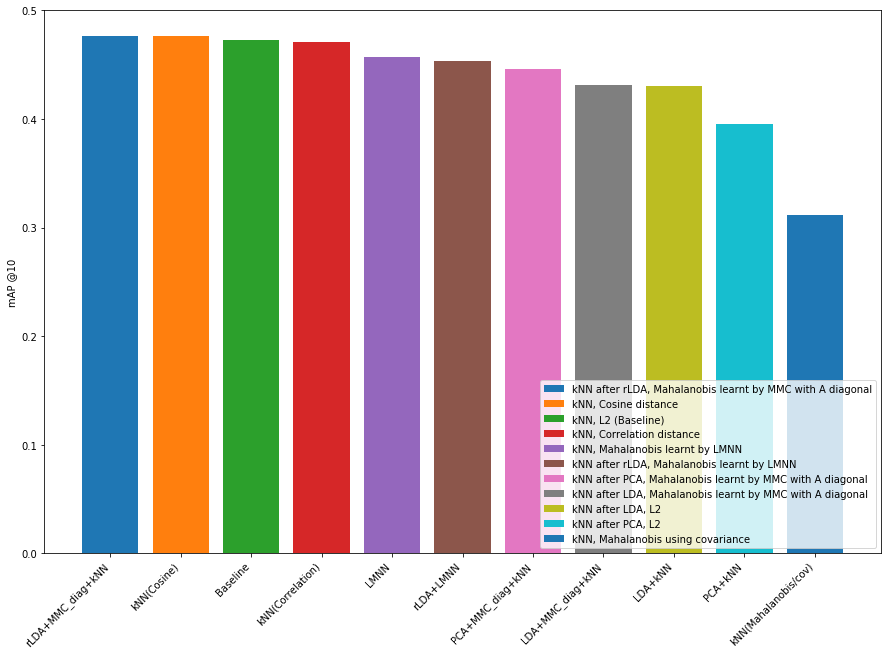

In [66]:
estimators = [(base, 'kNN, L2 (Baseline)', 'Baseline'),
          (knn_pca,'kNN after PCA, L2', 'PCA+kNN'), 
          (knn_lda, 'kNN after LDA, L2','LDA+kNN'),
          (benchmark[1], 'kNN, Correlation distance', 'kNN(Correlation)'), 
          (benchmark[2], 'kNN, Cosine distance', 'kNN(Cosine)'),
          (benchmark[3], 'kNN, Mahalanobis using covariance', 'kNN(Mahalanobis/cov)'), 
          (mmc_pca, 'kNN after PCA, Mahalanobis learnt by MMC with A diagonal', 'PCA+MMC_diag+kNN'), 
          (mmc_lda, 'kNN after LDA, Mahalanobis learnt by MMC with A diagonal', 'LDA+MMC_diag+kNN'), 
          (mmc_rlda, 'kNN after rLDA, Mahalanobis learnt by MMC with A diagonal', 'rLDA+MMC_diag+kNN'),
          (lmnn, 'kNN, Mahalanobis learnt by LMNN', 'LMNN'),
          (grid_pca_rlda__lmnn_knn.best_estimator_, 'kNN after rLDA, Mahalanobis learnt by LMNN', 'rLDA+LMNN')]
plt.figure(figsize=(15, 10))
estimators.sort(key=lambda x: x[0]._score_gallery, reverse=True)
for i, estimator in enumerate(estimators):
    plt.bar([i], [estimator[0]._score_gallery], label=estimator[1])
plt.legend(loc=4)
plt.ylabel("mAP @10")
plt.xticks(np.arange(11), [estimator[2] for estimator in estimators], rotation = 45, ha="right")
plt.show()